IMPORT LIBRARIES

In [1]:
from operator import concat
import kagglehub
import kagglehub.config
import json
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm
import pytorch_lightning as pl
from torchvision import transforms
import torch
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import train_test_split
import torchvision.transforms.functional as F
import random
from PIL import Image

# DOWNLOAD DATASET

we are using deepglobe-road-extraction-dataset from kaggle  
https://www.kaggle.com/datasets/payne18/road-detection-dataset-with-masks  
The dataset is already split into train, validation and test, but validation and test data does not have masks. We didn't want to manually annotate the validation and test data, so we only use the train dataset.


In [2]:
# get kaggle.json file form ./kaggle.json
with open("./kaggle.json", "r") as f:
    kaggle_json = json.load(f)
kaggel_username = kaggle_json["username"]
kaggel_key = kaggle_json["key"]

In [3]:
kagglehub.config.set_kaggle_credentials(kaggel_username, kaggel_key)

Kaggle credentials set.


In [4]:
# Download latest version
path = kagglehub.dataset_download("payne18/road-detection-dataset-with-masks")


100%|██████████| 3.81G/3.81G [02:36<00:00, 26.2MB/s]

Extracting files...


In [5]:
#make data folder if not existing
if not os.path.exists("./data"):
    os.mkdir("./data")
# Move data folder to ./data
os.system(f"mv {path} ./data/road-detection-dataset-with-masks")
# remove empty folder
folder_to_remove = path.split("payne18/road-detection-dataset-with-masks")[0] 
os.system((f"rm -r {folder_to_remove}"))

0

# LOAD DATA

In [6]:
data_path = os.path.abspath("./data/road-detection-dataset-with-masks/deepglobe-road-extraction-dataset")
metadata_path = "./data/road-detection-dataset-with-masks/deepglobe-road-extraction-dataset/metadata.csv"

In [7]:
#open metadata
metadata = pd.read_csv(metadata_path)
print(f"All data: {metadata.shape[0]}")
metadata.head()

All data: 8570


,image_id,split,sat_image_path,mask_path
0,100034,train,train/100034_sat.jpg,train/100034_mask.png
1,100081,train,train/100081_sat.jpg,train/100081_mask.png
2,100129,train,train/100129_sat.jpg,train/100129_mask.png
3,100703,train,train/100703_sat.jpg,train/100703_mask.png
4,100712,train,train/100712_sat.jpg,train/100712_mask.png


In [8]:
# delete rows where split is not train
metadata = metadata[metadata["split"] == "train"]
print(f"Data withouth validation and test: {metadata.shape[0]}")
metadata.head()

Data withouth validation and test: 6226


,image_id,split,sat_image_path,mask_path
0,100034,train,train/100034_sat.jpg,train/100034_mask.png
1,100081,train,train/100081_sat.jpg,train/100081_mask.png
2,100129,train,train/100129_sat.jpg,train/100129_mask.png
3,100703,train,train/100703_sat.jpg,train/100703_mask.png
4,100712,train,train/100712_sat.jpg,train/100712_mask.png


In [9]:
# extend paths to full path
metadata["sat_image_path"] = metadata["sat_image_path"].apply(lambda x: os.path.join(data_path, x))
metadata["mask_path"] = metadata["mask_path"].apply(lambda x: os.path.join(data_path, x))
metadata.head()

,image_id,split,sat_image_path,mask_path
0,100034,train,/Users/panczelbence/Documents/egyetem/MSc/2_Fe...,/Users/panczelbence/Documents/egyetem/MSc/2_Fe...
1,100081,train,/Users/panczelbence/Documents/egyetem/MSc/2_Fe...,/Users/panczelbence/Documents/egyetem/MSc/2_Fe...
2,100129,train,/Users/panczelbence/Documents/egyetem/MSc/2_Fe...,/Users/panczelbence/Documents/egyetem/MSc/2_Fe...
3,100703,train,/Users/panczelbence/Documents/egyetem/MSc/2_Fe...,/Users/panczelbence/Documents/egyetem/MSc/2_Fe...
4,100712,train,/Users/panczelbence/Documents/egyetem/MSc/2_Fe...,/Users/panczelbence/Documents/egyetem/MSc/2_Fe...


VISUALIZE DATA

In [10]:
# select 4 random images
random_index = np.random.randint(0, metadata.shape[0], 4)
images = [cv2.imread(metadata.iloc[i]["sat_image_path"]) for i in random_index]
masks = [cv2.imread(metadata.iloc[i]["mask_path"]) for i in random_index]

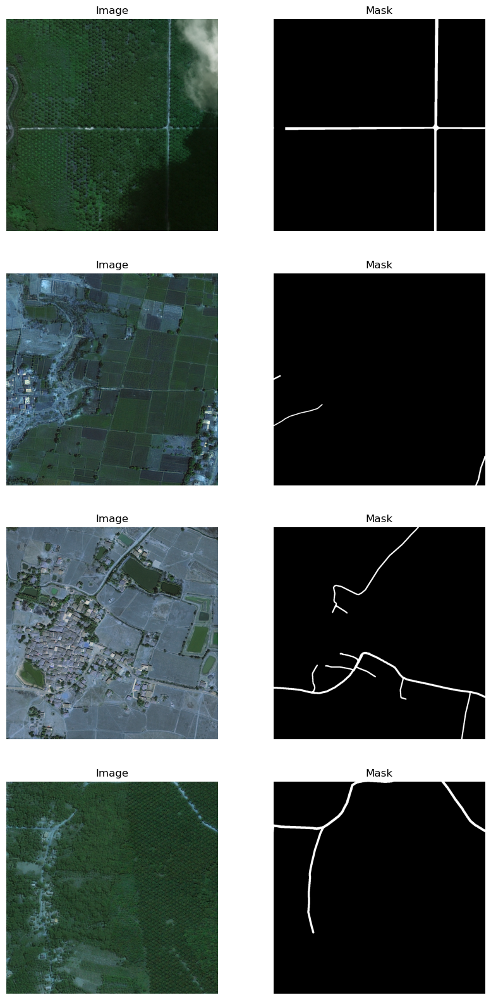

In [11]:
# Plot images and masks
fig, axs = plt.subplots(4, 2, figsize=(10, 20))
for i in range(4):
    axs[i, 0].imshow(images[i])
    axs[i, 0].title.set_text("Image")
    axs[i, 1].imshow(masks[i])
    axs[i, 1].title.set_text("Mask")
    axs[i, 0].axis("off")
    axs[i, 1].axis("off")
plt.show()


# ANALYSE DATA


In [12]:
# check image size
image_sizes, rgb = [], []
for i in tqdm(range(metadata.shape[0])):
    image = cv2.imread(metadata.iloc[i]["sat_image_path"])
    image_sizes.append(image.shape)
    r_avg, g_avg, b_avg = np.mean(image, axis=(0, 1))
    r_std, g_std, b_std = np.std(image, axis=(0, 1))
    r_mean, g_mean, b_mean = np.mean(image, axis=(0, 1))
    rgb.append([r_avg, g_avg, b_avg, r_std, g_std, b_std, r_mean, g_mean, b_mean])

100%|██████████| 6226/6226 [06:26<00:00, 16.10it/s]


In [13]:
image_sizes_pd = pd.DataFrame(image_sizes, columns=["height", "width", "channels"])
rgb_pd = pd.DataFrame(rgb, columns=["r_avg", "g_avg", "b_avg", "r_std", "g_std", "b_std", "r_mean", "g_mean", "b_mean"])

In [14]:
image_sizes_pd.describe()

,height,width,channels
count,6226.0,6226.0,6226.0
mean,1024.0,1024.0,3.0
std,0.0,0.0,0.0
min,1024.0,1024.0,3.0
25%,1024.0,1024.0,3.0
50%,1024.0,1024.0,3.0
75%,1024.0,1024.0,3.0
max,1024.0,1024.0,3.0


In [15]:
rgb_pd.describe()

,r_avg,g_avg,b_avg,r_std,g_std,b_std,r_mean,g_mean,b_mean
count,6226.000000,6226.000000,6226.000000,6226.000000,6226.000000,6226.000000,6226.000000,6226.000000,6226.000000
mean,73.471182,97.622860,104.475352,24.630736,26.913975,32.915325,73.471182,97.622860,104.475352
std,16.348767,15.071360,20.453406,10.164307,9.588336,9.291930,16.348767,15.071360,20.453406
min,20.375286,38.684312,27.887835,4.327796,5.034785,6.351232,20.375286,38.684312,27.887835
25%,62.069026,87.763815,93.244855,17.006863,19.728226,25.939376,62.069026,87.763815,93.244855
50%,72.473289,97.957135,104.554862,22.271432,25.470414,32.222740,72.473289,97.957135,104.554862
75%,82.299639,106.210632,116.831202,30.300803,32.463710,39.031606,82.299639,106.210632,116.831202
max,191.631575,202.198712,196.773822,60.186797,60.799106,65.496826,191.631575,202.198712,196.773822


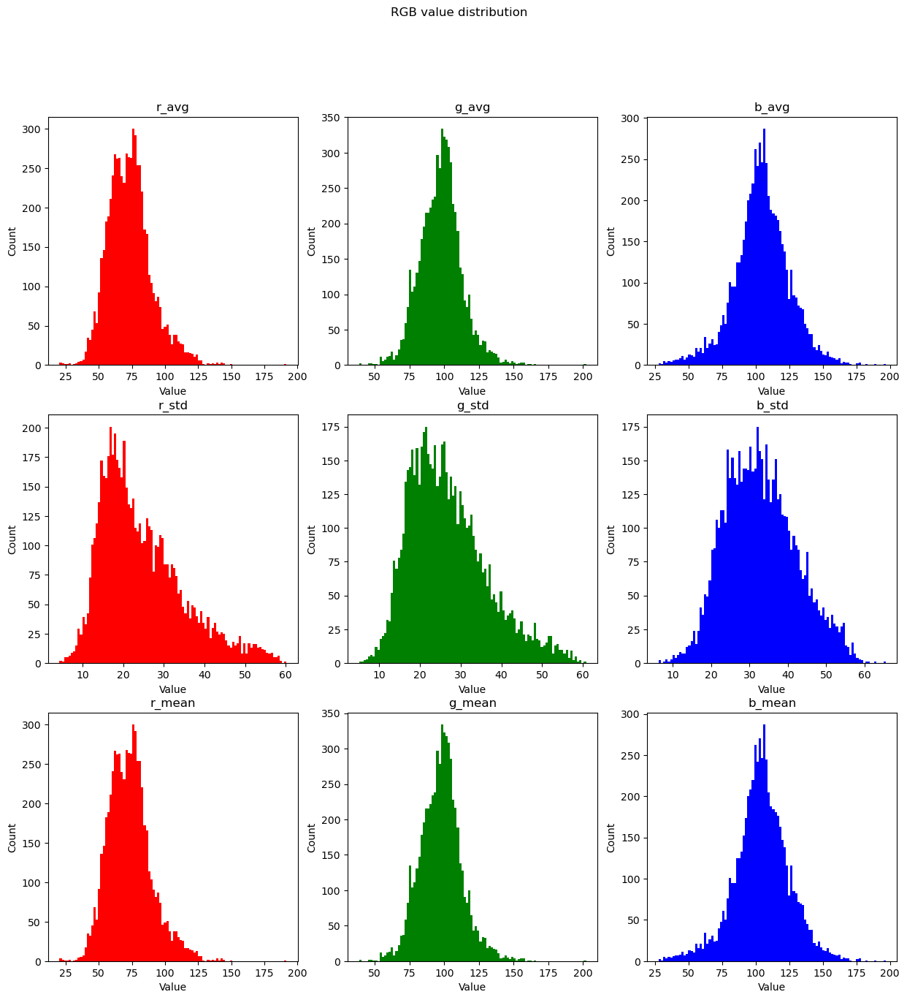

In [16]:
# draw rgb values on plots
fig, axs = plt.subplots(3, 3, figsize=(15, 15))
#add title
fig.suptitle("RGB value distribution")
for i, column in enumerate(rgb_pd.columns):
    color = "red" if i % 3 == 0 else "green" if i % 3 == 1 else "blue"
    axs[i // 3, i % 3].hist(rgb_pd[column], bins=100, color=color)
    axs[i // 3, i % 3].title.set_text(column)
    axs[i // 3, i % 3].set_xlabel("Value")
    axs[i // 3, i % 3].set_ylabel("Count")
plt.show()

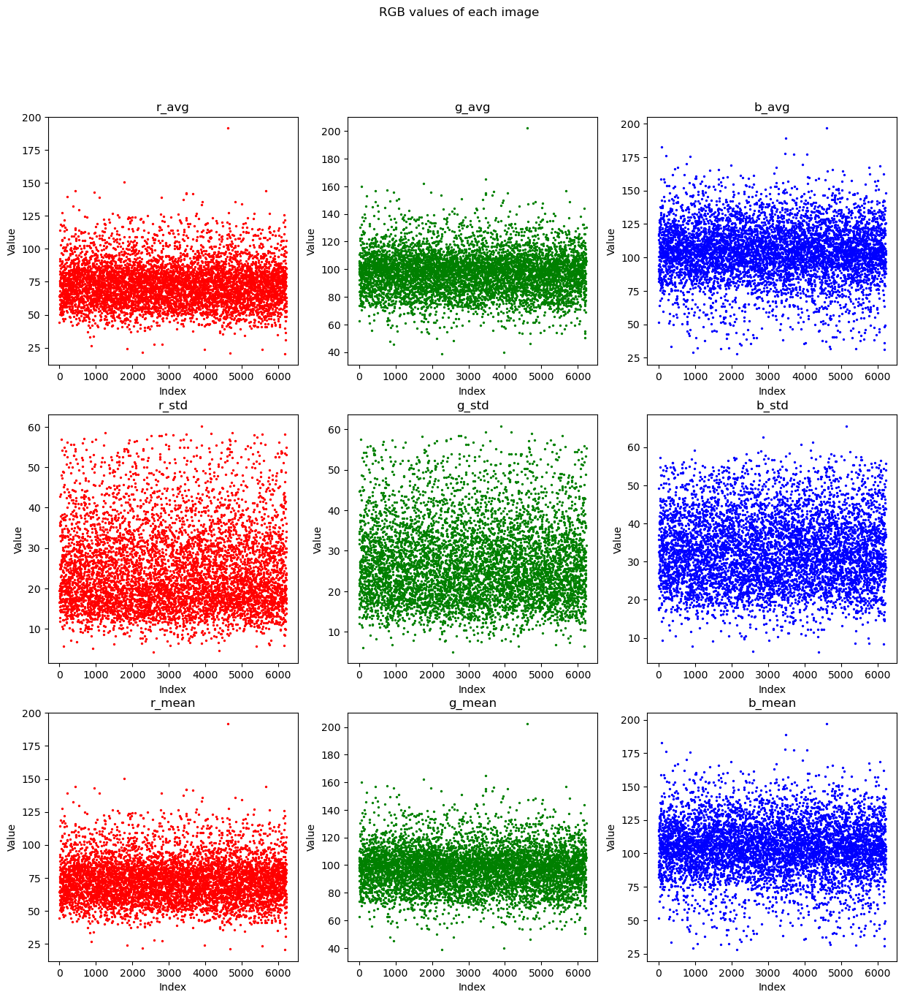

In [17]:
#plot values of rgb
fig, axs = plt.subplots(3, 3, figsize=(15, 15))
#add title
fig.suptitle("RGB values of each image")
for i, column in enumerate(rgb_pd.columns):
    color = "red" if i % 3 == 0 else "green" if i % 3 == 1 else "blue"
    axs[i // 3, i % 3].scatter(list(range(len(rgb_pd[column]))), rgb_pd[column], color=color, s=2)
    axs[i // 3, i % 3].title.set_text(column)
    axs[i // 3, i % 3].set_xlabel("Index")
    axs[i // 3, i % 3].set_ylabel("Value")
plt.show()

In [18]:
def plot_outliers(outliers, title, mask=False):
    random_outliers = np.random.choice(outliers.index, 9, replace=False)
    fig, axs = plt.subplots(3, 3, figsize=(15, 15))
    #title
    fig.suptitle(title)
    for i, index in enumerate(random_outliers):
        if mask:
            image = cv2.imread(metadata.iloc[index]["mask_path"])
        else:
            image = cv2.imread(metadata.iloc[index]["sat_image_path"])
        axs[i // 3, i % 3].imshow(image)
        axs[i // 3, i % 3].title.set_text(f"index: {index}")
        axs[i // 3, i % 3].axis("off")
    plt.show()

In [19]:
def get_outliers(data, column):
    r_min, r_max = data[f"r_{column}"].quantile(0.001), data[f"r_{column}"].quantile(0.999)
    g_min, g_max = data[f"g_{column}"].quantile(0.001), data[f"g_{column}"].quantile(0.999)
    b_min, b_max = data[f"b_{column}"].quantile(0.001), data[f"b_{column}"].quantile(0.999)
    
    return data[(data[f"r_{column}"] < r_min) | (data[f"r_{column}"] > r_max) | (data[f"g_{column}"] < g_min) | (data[f"g_{column}"] > g_max) | (data[f"b_{column}"] < b_min) | (data[f"b_{column}"] > b_max)]

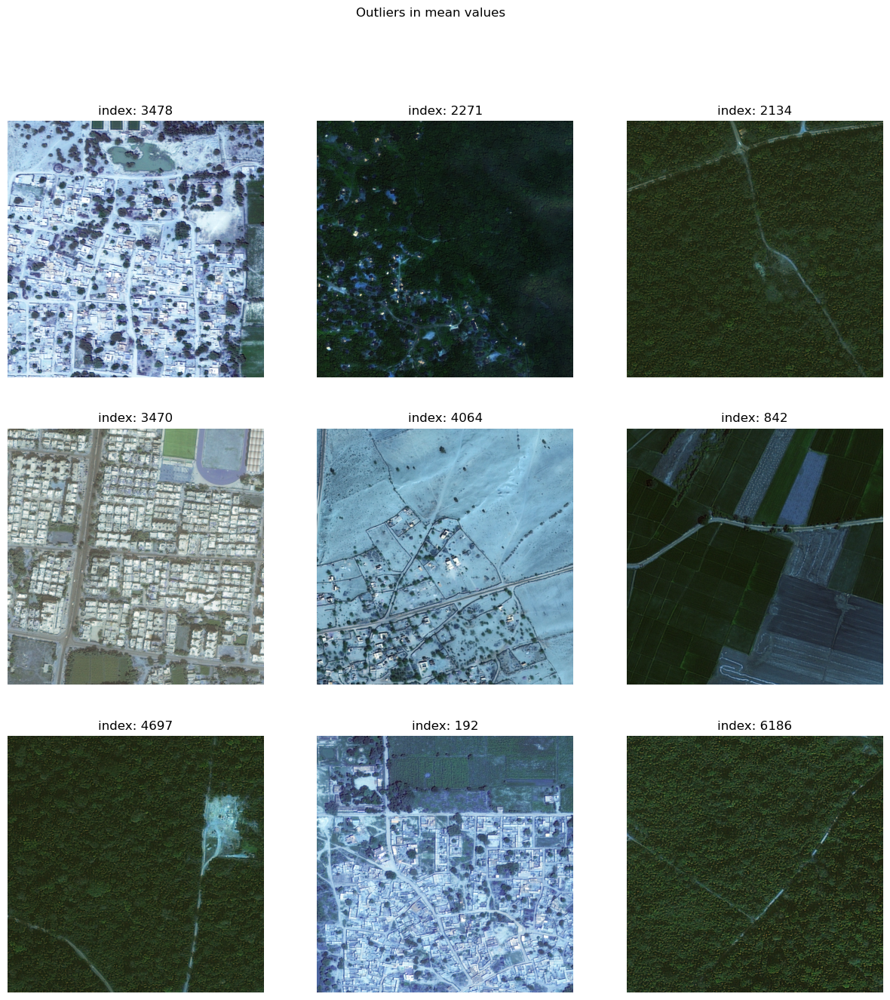

In [20]:
mean_outliers = get_outliers(rgb_pd, "mean")
plot_outliers(mean_outliers, "Outliers in mean values")

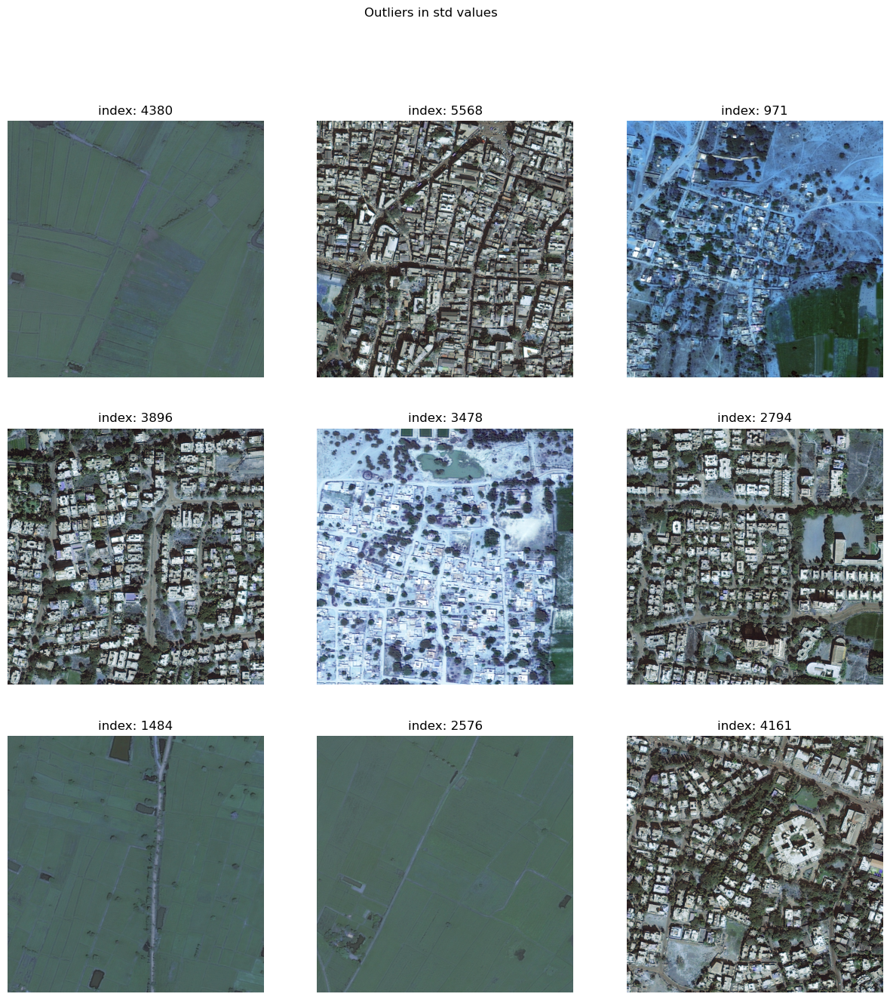

In [21]:
std_outliers = get_outliers(rgb_pd, "std")
plot_outliers(std_outliers, "Outliers in std values")

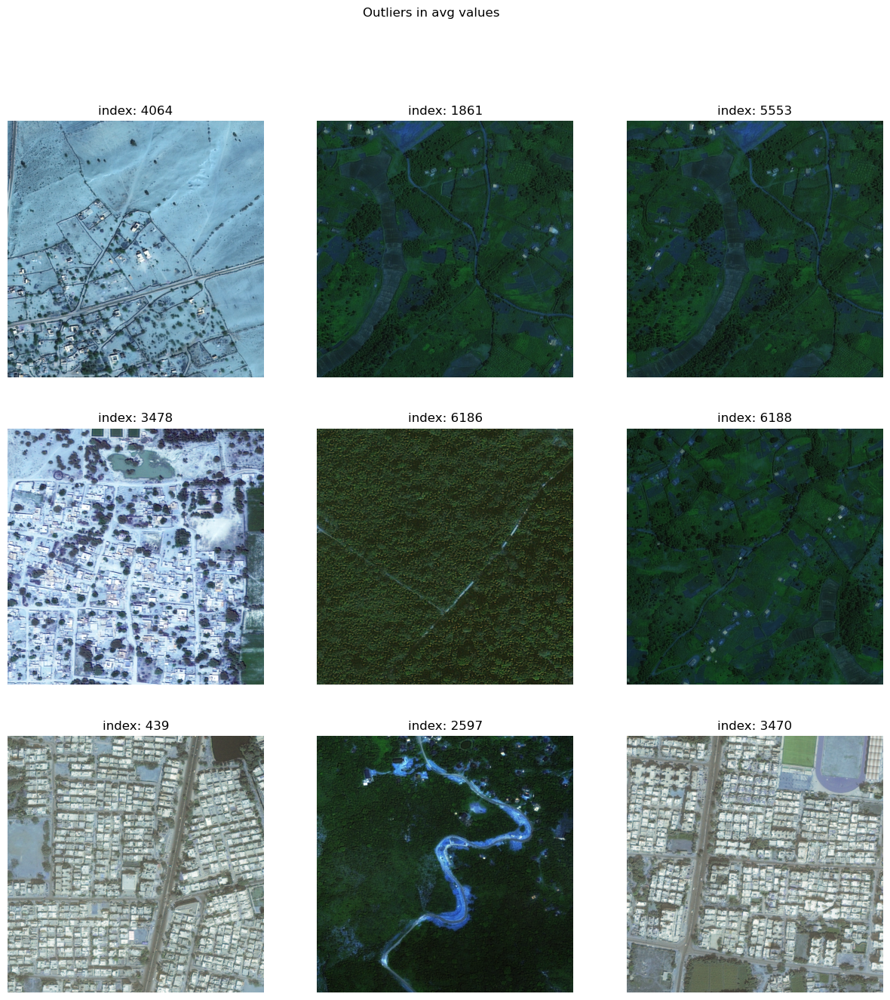

In [22]:
avg_outliers = get_outliers(rgb_pd, "avg")
plot_outliers(avg_outliers, "Outliers in avg values")

In [23]:
# check mask size
image_sizes, rgb = [], []
for i in tqdm(range(metadata.shape[0])):
    image = cv2.imread(metadata.iloc[i]["mask_path"])
    image_sizes.append(image.shape)
    r_avg, g_avg, b_avg = np.mean(image, axis=(0, 1))
    r_std, g_std, b_std = np.std(image, axis=(0, 1))
    r_mean, g_mean, b_mean = np.mean(image, axis=(0, 1))
    rgb.append([r_avg, g_avg, b_avg, r_std, g_std, b_std, r_mean, g_mean, b_mean])

100%|██████████| 6226/6226 [05:42<00:00, 18.19it/s]


In [24]:
masks_sizes_pd = pd.DataFrame(image_sizes, columns=["height", "width", "channels"])
mask_rgb_pd = pd.DataFrame(rgb, columns=["r_avg", "g_avg", "b_avg", "r_std", "g_std", "b_std", "r_mean", "g_mean", "b_mean"])

In [25]:
masks_sizes_pd.describe()

,height,width,channels
count,6226.0,6226.0,6226.0
mean,1024.0,1024.0,3.0
std,0.0,0.0,0.0
min,1024.0,1024.0,3.0
25%,1024.0,1024.0,3.0
50%,1024.0,1024.0,3.0
75%,1024.0,1024.0,3.0
max,1024.0,1024.0,3.0


In [26]:
mask_rgb_pd.describe()

,r_avg,g_avg,b_avg,r_std,g_std,b_std,r_mean,g_mean,b_mean
count,6226.000000,6226.000000,6226.000000,6226.000000,6226.000000,6226.000000,6226.000000,6226.000000,6226.000000
mean,10.805536,10.805536,10.805536,45.792574,45.792574,45.792574,10.805536,10.805536,10.805536
std,10.601057,10.601057,10.601057,20.721895,20.721895,20.721895,10.601057,10.601057,10.601057
min,0.376940,0.376940,0.376940,9.796814,9.796814,9.796814,0.376940,0.376940,0.376940
25%,3.456903,3.456903,3.456903,29.488302,29.488302,29.488302,3.456903,3.456903,3.456903
50%,6.445184,6.445184,6.445184,40.024761,40.024761,40.024761,6.445184,6.445184,6.445184
75%,14.737312,14.737312,14.737312,59.504841,59.504841,59.504841,14.737312,14.737312,14.737312
max,74.783392,74.783392,74.783392,116.091383,116.091383,116.091383,74.783392,74.783392,74.783392


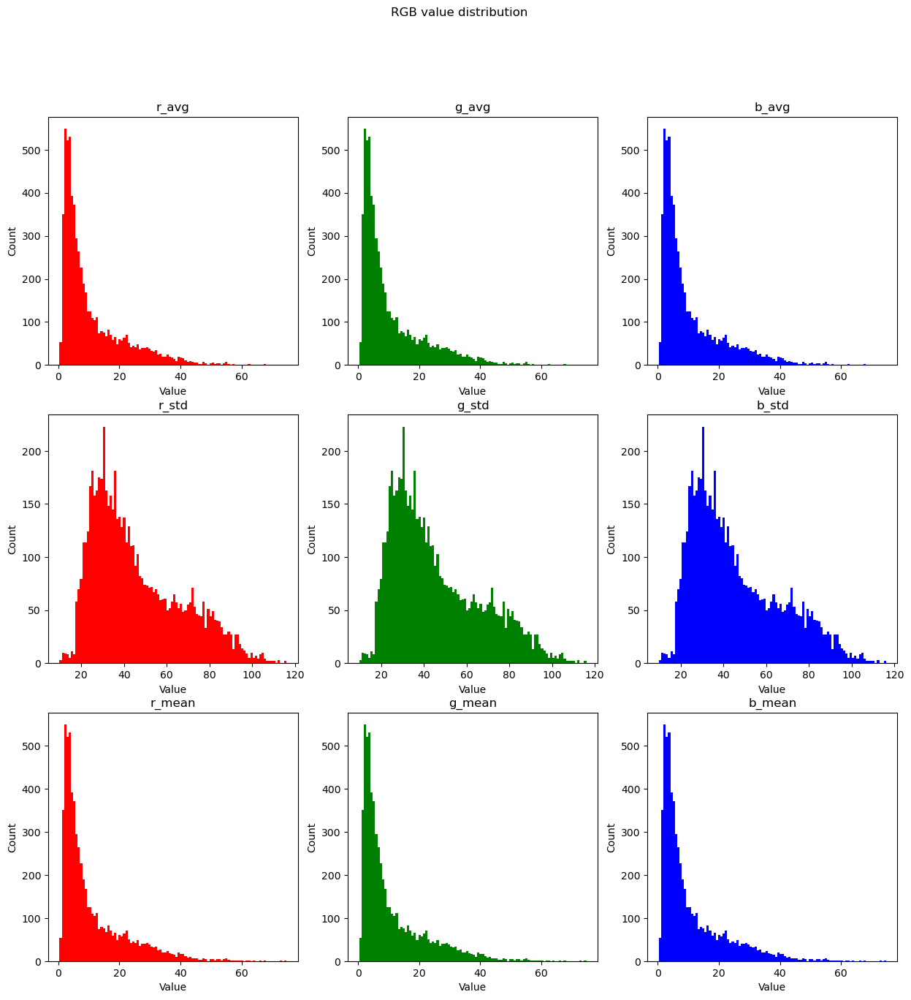

In [27]:
fig, axs = plt.subplots(3, 3, figsize=(15, 15))
#add title
fig.suptitle("RGB value distribution")
for i, column in enumerate(mask_rgb_pd.columns):
    color = "red" if i % 3 == 0 else "green" if i % 3 == 1 else "blue"
    axs[i // 3, i % 3].hist(mask_rgb_pd[column], bins=100, color=color)
    axs[i // 3, i % 3].title.set_text(column)
    axs[i // 3, i % 3].set_xlabel("Value")
    axs[i // 3, i % 3].set_ylabel("Count")
plt.show()

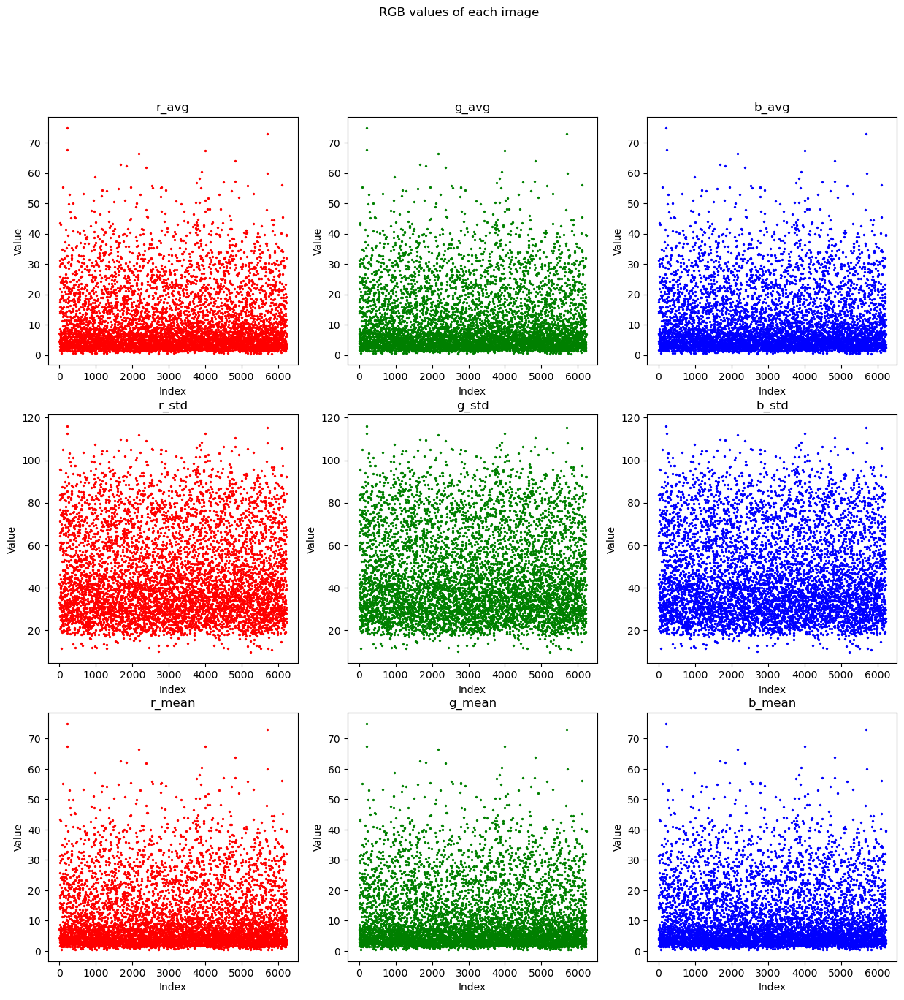

In [28]:
fig, axs = plt.subplots(3, 3, figsize=(15, 15))
#add title
fig.suptitle("RGB values of each image")
for i, column in enumerate(mask_rgb_pd.columns):
    color = "red" if i % 3 == 0 else "green" if i % 3 == 1 else "blue"
    axs[i // 3, i % 3].scatter(list(range(len(mask_rgb_pd[column]))), mask_rgb_pd[column], color=color, s=2)
    axs[i // 3, i % 3].title.set_text(column)
    axs[i // 3, i % 3].set_xlabel("Index")
    axs[i // 3, i % 3].set_ylabel("Value")
plt.show()

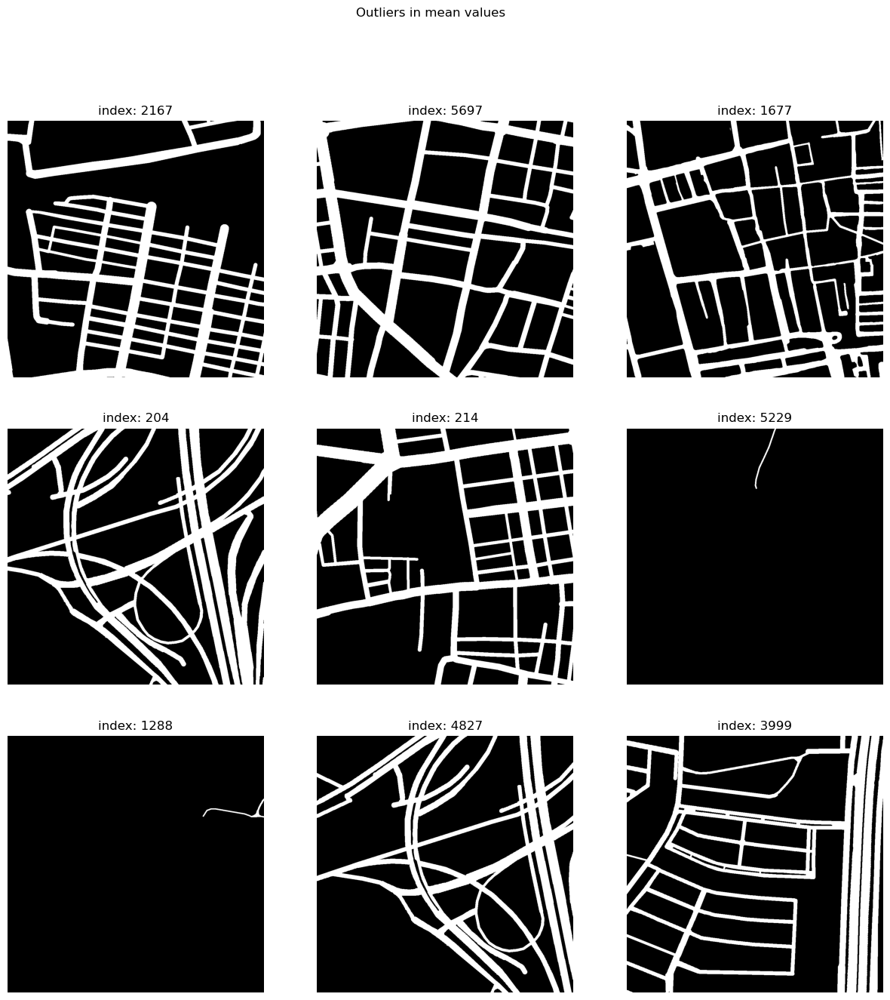

In [29]:
# get outliers in mean values
mean_outliers = get_outliers(mask_rgb_pd, "mean")
plot_outliers(mean_outliers, "Outliers in mean values", mask=True)

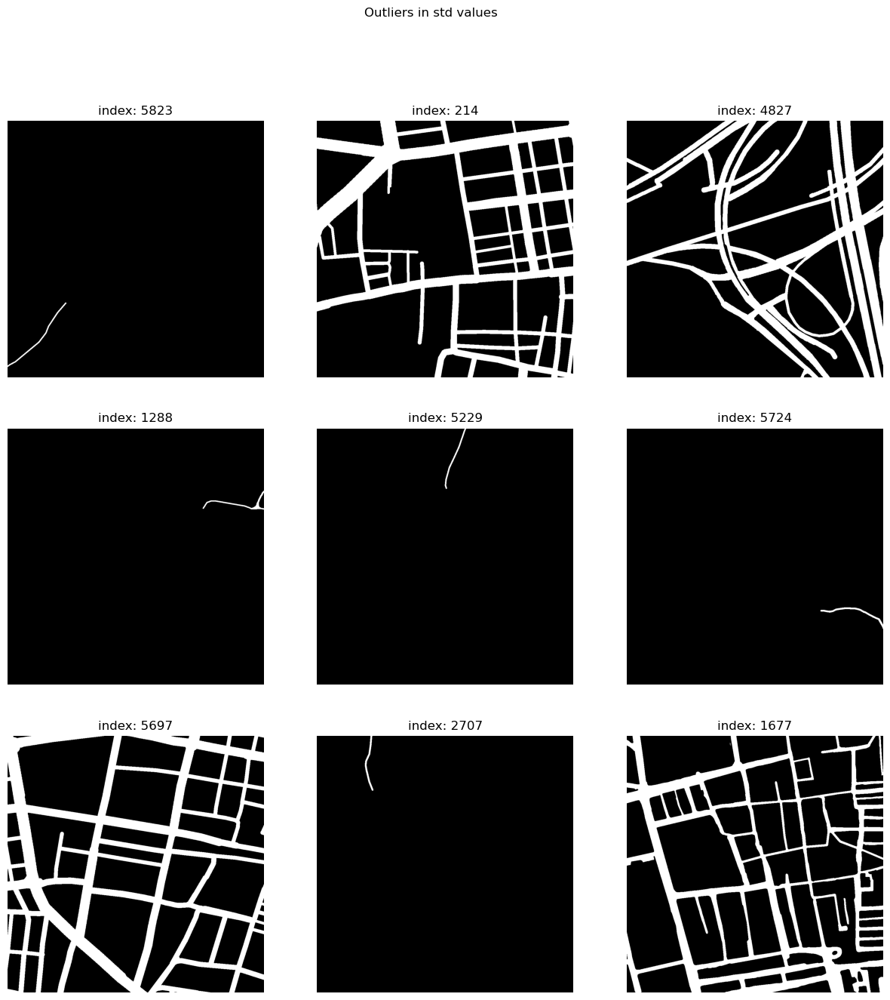

In [30]:
# get outliers in std values
std_outliers = get_outliers(mask_rgb_pd, "std")
plot_outliers(std_outliers, "Outliers in std values", mask=True)

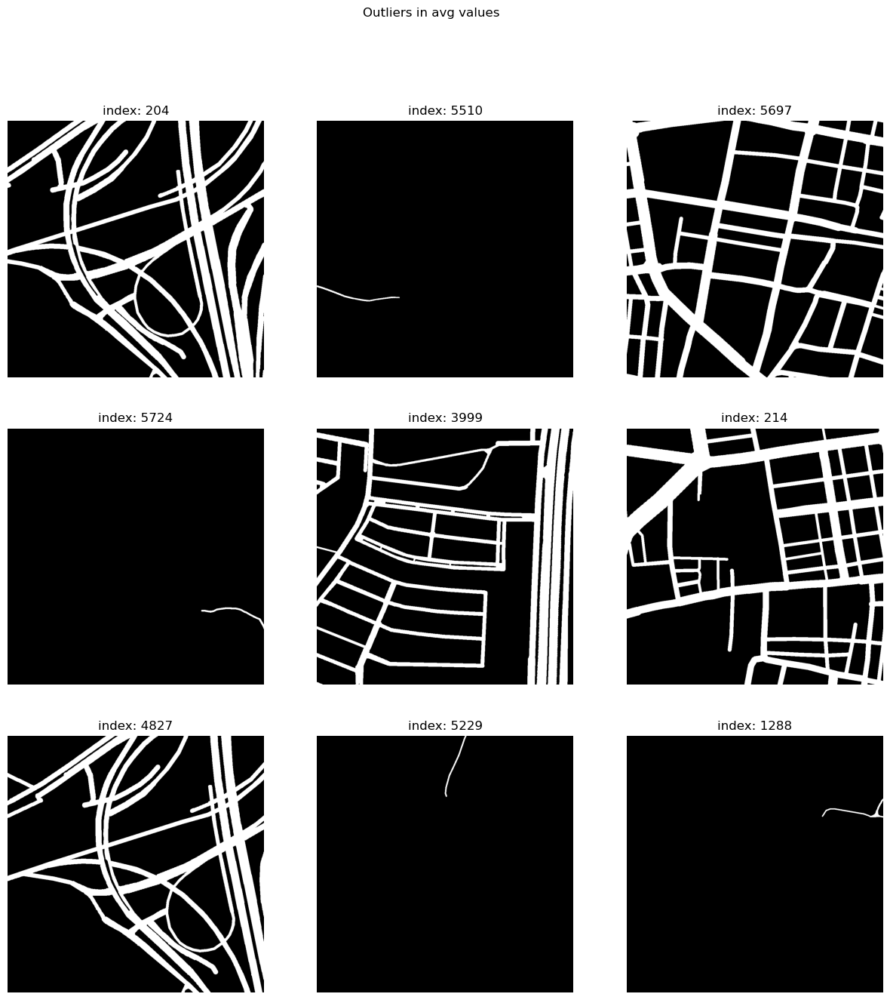

In [31]:
# get outliers in avg values
avg_outliers = get_outliers(mask_rgb_pd, "avg")
plot_outliers(avg_outliers, "Outliers in avg values", mask=True)

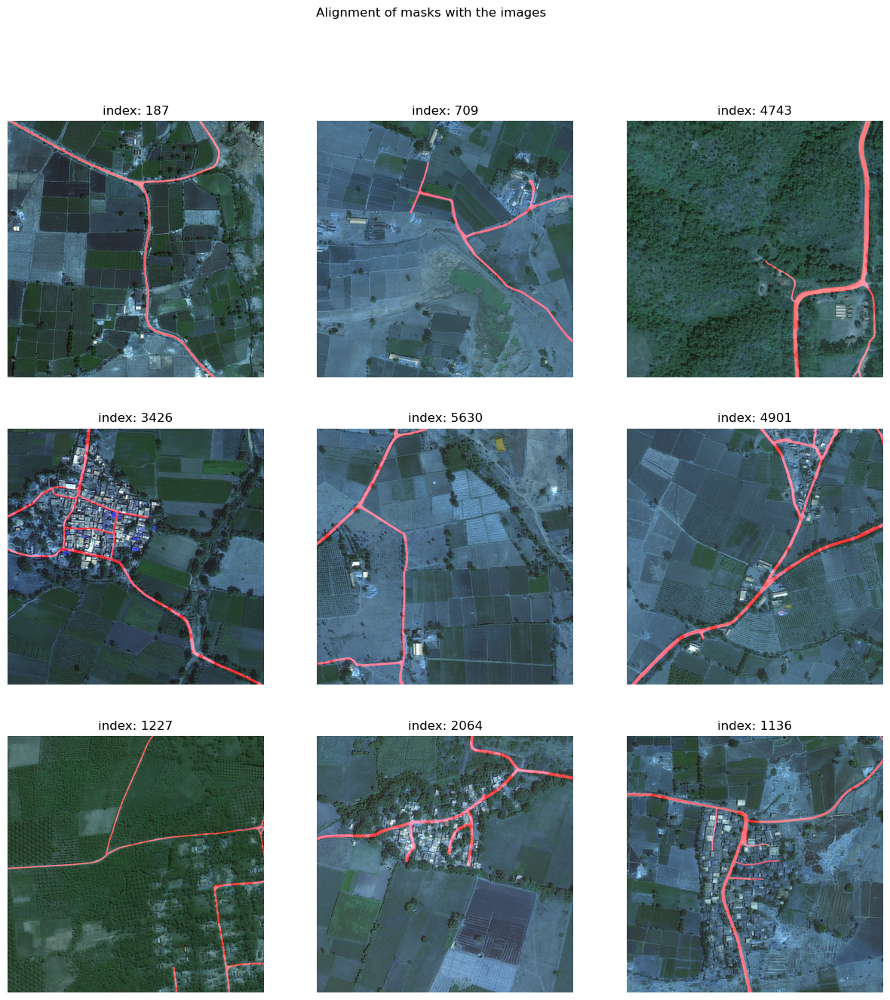

In [32]:
# checking the alignment of the masks with the images
random_index = np.random.randint(0, metadata.shape[0], 9)
images = [cv2.imread(metadata.iloc[i]["sat_image_path"]) for i in random_index]
masks = [cv2.imread(metadata.iloc[i]["mask_path"]) for i in random_index]
#put images and masks on top of each other
fig, axs = plt.subplots(3, 3, figsize=(15, 15))
#add title
fig.suptitle("Alignment of masks with the images")
for i in range(9):
    #maiking the white parts of the mask green
    mask = masks[i]
    for j in range(3):
        mask[mask[:, :, j] == 255] = np.array([255, 0, 0])
    axs[i // 3, i % 3].imshow(cv2.addWeighted(images[i], 1, mask, 1, 0))
    axs[i // 3, i % 3].title.set_text(f"index: {random_index[i]}")
    axs[i // 3, i % 3].axis("off")
plt.show()

# Not all roads are annotated
## Example:

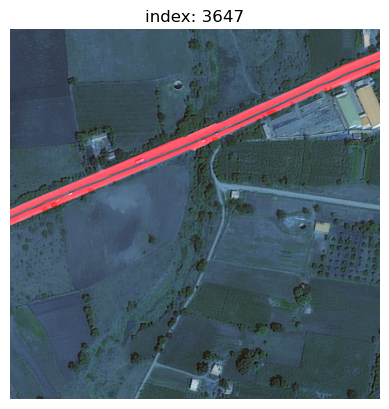

In [33]:
# show index 3647
image = cv2.imread(metadata.iloc[3647]["sat_image_path"])
mask = cv2.imread(metadata.iloc[3647]["mask_path"])
mask[mask[:, :, 0] == 255] = np.array([255, 0, 0])
plt.imshow(cv2.addWeighted(image, 1, mask, 1, 0))
plt.title("index: 3647")
plt.axis("off")
plt.show()

# Conclusion  
- The all images and masks have the same size (1024x1024x3)
- The RGB values are in the range of 0-255
- The outliers in the RGB values are not significant, in most cases the outlier images are images of highly polluted areas or forests
- The masks are binary images, where the road is white and the rest is black
- The masks are not noisy
- #### **Some roads are not annotated**

# Create a dataset

In [34]:
class RoadDataset(Dataset):
    def __init__(self, metadata, size=512, train = True):
        self.metadata = metadata
        self.train = train
        self.size = size
        
    def __len__(self):
        return self.metadata.shape[0]
    
    def __getitem__(self, index):
        image = cv2.imread(self.metadata.iloc[index]["sat_image_path"])
        mask = cv2.imread(self.metadata.iloc[index]["mask_path"])
        
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Convert image and mask to PIL Images to apply torchvision transforms
        image = Image.fromarray(image)
        mask = Image.fromarray(mask)
        
        if(self.train):
            if random.random() > 0.5:
                image = F.hflip(image)
                mask = F.hflip(mask)      
            
            if random.random() > 0.5:
                image = F.vflip(image)
                mask = F.vflip(mask)
                
            # Get the same crop parameters for both the image and mask
            i, j, h, w = transforms.RandomResizedCrop.get_params(image, scale=(0.5, 1.0), ratio=(1.0, 1.0))
        
        
            image = F.resized_crop(image, i, j, h, w, (self.size, self.size))
            mask = F.resized_crop(mask, i, j, h, w, (self.size, self.size))
        
        else:
            image = F.resize(image, (self.size, self.size))
            mask = F.resize(mask, (self.size, self.size))
        
        image = F.to_tensor(image)
        mask = F.to_tensor(mask)
        
        mask = torch.where(mask > 0, 1, 0)
        image = F.normalize(image, mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
            
        return image, mask

# CREATE A DATALOADER

In [35]:
class RoadDataLoader(pl.LightningDataModule):
    def __init__(self, metadata, batch_size):
        super().__init__()
        self.metadata = metadata
        self.batch_size = batch_size
        
    def setup(self, stage=None):
        # Split metadata into training, validation, and test sets
        train_data, val_data = train_test_split(self.metadata, test_size=0.2, random_state=42)
        self.train_data, self.test_data = train_test_split(train_data, test_size=0.1, random_state=42)
        self.val_data = val_data
        
    def train_dataloader(self):
        train_dataset = RoadDataset(self.train_data, train=True)
        return DataLoader(train_dataset, batch_size=self.batch_size, shuffle=True)

    def val_dataloader(self):
        val_dataset = RoadDataset(self.val_data)
        return DataLoader(val_dataset, batch_size=self.batch_size)

    def test_dataloader(self):
        test_dataset = RoadDataset(self.test_data)
        return DataLoader(test_dataset, batch_size=self.batch_size)

# TEST DATALOADER

In [36]:
def denormalize(tensor, mean, std):
    mean = mean[:, None, None] 
    std = std[:, None, None]
    tensor = tensor * std + mean 
    return tensor

def show_data(images, masks):
    fig, axs = plt.subplots(4, 2, figsize=(10, 20))
    for i in range(4):
        mean = torch.tensor([0.5, 0.5, 0.5])
        std = torch.tensor([0.5, 0.5, 0.5])
        denormalized_image = denormalize(images[i], mean, std)
        denormalized_image = denormalized_image.permute(1, 2, 0).numpy()
        denormalized_mask = denormalize(masks[i], mean, std)
        denormalized_mask = denormalized_mask.permute(1, 2, 0).numpy()
        axs[i, 0].imshow(denormalized_image)
        axs[i, 0].title.set_text("Image")
        axs[i, 1].imshow(denormalized_mask)
        axs[i, 1].title.set_text("Mask")
        axs[i, 0].axis("off")
        axs[i, 1].axis("off")
    plt.show()

In [37]:
# Initialize dataloader
data_loader = RoadDataLoader(metadata, 32)
data_loader.setup()

In [38]:
train_loader = data_loader.train_dataloader()
val_loader = data_loader.val_dataloader()
test_loader = data_loader.test_dataloader()

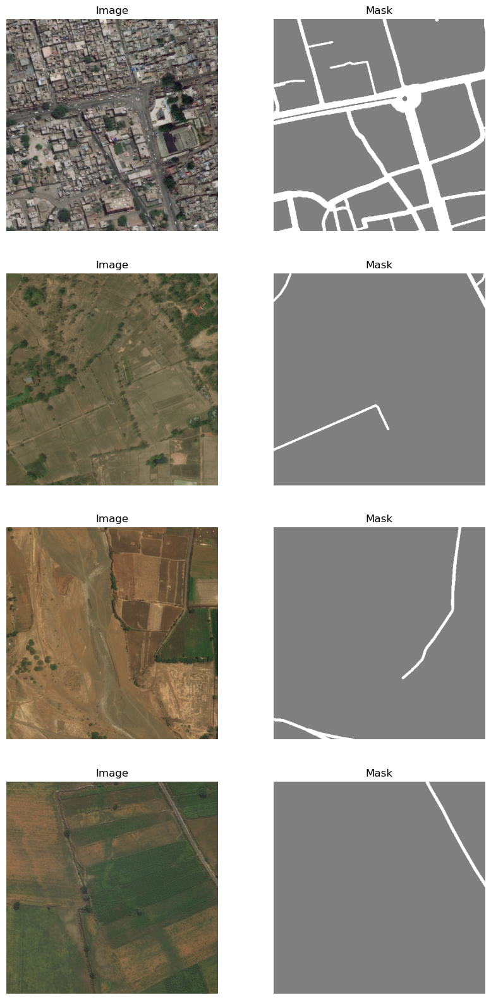

In [39]:
#visualize data from train_loader
for batch_idx, (images, masks) in enumerate(train_loader):
    break
show_data(images, masks)

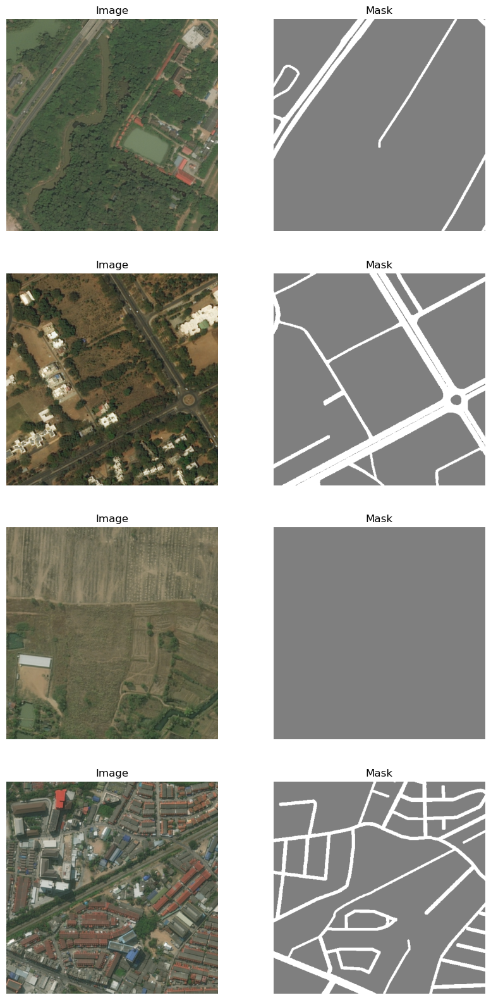

In [40]:
#visualize data from val_loader
images, masks = next(iter(val_loader))
show_data(images, masks)

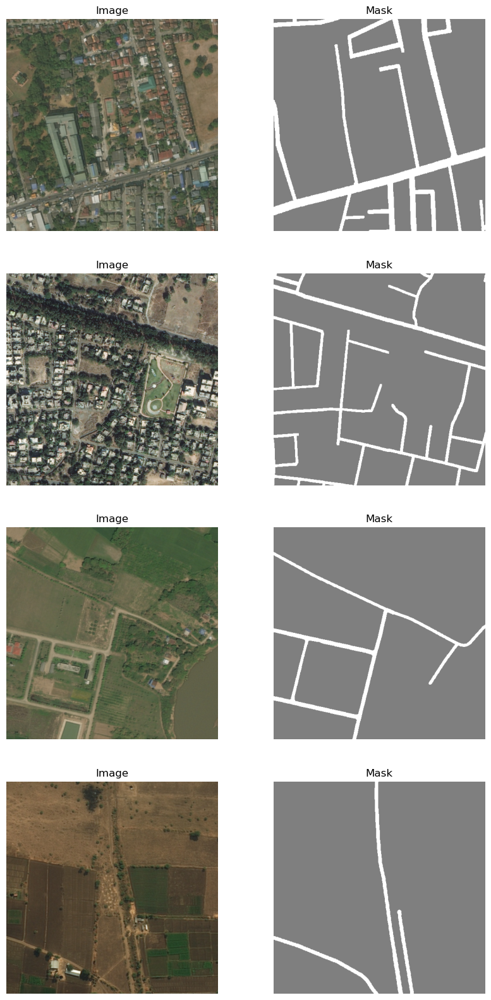

In [41]:
#visualize data from test_loader
images, masks = next(iter(test_loader))
show_data(images, masks)